## Introduction

This starter code demonstrates how to use load the original ECoG data (i.e. the neural recordings) as well as the model data that, when combined, give the neural flow data. This notebook includes two things:
* how the flow video are created from the data
* how the flow distributions can be evaluated using KL divergende (some inital code)

The code uses many poorly documented classes and functions for loading and processing the data. Typically, you shouldn't be too concerned about whats going on in those functions. The only class that is relevant for you is **FlowLoader**. You don't really have to understand to much of whats going inside its functions, but you should understand the meaning of the input and output parameters.

In [122]:
import numpy as np
import pandas as pd

from preprocess import ECoGPreprocess
from network_flow_models import NetworkFlow, Graph, NetworkAnimation
from postprocess import FlowLoader
from matplotlib import pyplot as plt
import networkx as nx
import pickle
import time
import os
from tqdm.notebook import tqdm
from matplotlib import cm
from scipy import stats
import matplotlib.animation as animation
from scipy import signal

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
#plt.rcParams["font.family"] = "cmr10"
#font = {'family' : 'cmr10',
#        'size'   : 40}
#matplotlib.rc('font', **font)
#matplotlib.rcParams['mathtext.it'] = 'cmmi10'

## Generation of Flow Videos

A flow video is just a concatenation of multiple flow snapshots. Each flow snapshot can be stored in a a vector. Therefore, an entire flow video can be represented as a matrix whose columns are the individual flow snapshots.

The flow video generated below represents the average flow during conditioning for a single session.

First load and display the flow for a single trial. if you change the variable *index*, you will probably see significant changes in the flow pattern

In [2]:
# You have to change those paths to where you have stored the data
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

# flow matrix for a single trial (here using the 10th instance)
index = 10 # the index of the trail
flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', 1, bp_filter=[])
flow_mtx_single = flow_loader.get_single_flow_mtx(index)

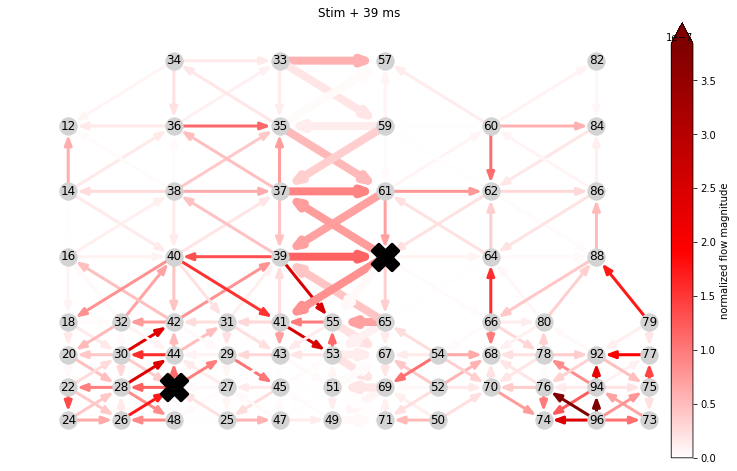

In [3]:
# create and play the animation
nf_anim = flow_loader.generate_animation(flow_mtx_single)

ani = animation.FuncAnimation(nf_anim.fig, nf_anim.animate, np.shape(flow_mtx_single)[1], interval=500)
#ani.save('flow_movie.gif', fps=20, savefig_kwargs={
#    'transparent': True,
#})
from IPython.display import HTML
HTML(ani.to_jshtml())

Now compute and play the average flow during stimulation of the entire session

In [4]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

block_ids = [1,2,3,4,5] # numbers of conditioning blocks
total_iter_cnt = 0 # counter for total number of iterations

# iterate over all conditioning blocks
for block_id in tqdm(block_ids):
    flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

    # iterate over all trials
    num_fits = flow_loader.get_num_model_fits()
    for i in range(num_fits):
        if total_iter_cnt == 0:
            flow_mtx_avg = flow_loader.get_single_flow_mtx(i)
            np_mtx_avg, t, stim_time, idx = flow_loader.preprocess.select_data_around_stim(
                i, flow_loader.T, which_stim=flow_loader.which_stim
            )
        else:
            flow = flow_loader.get_single_flow_mtx(i)
            flow_mtx_avg += flow
        total_iter_cnt += 1

# compute average flow
flow_mtx_avg /= total_iter_cnt

  0%|          | 0/5 [00:00<?, ?it/s]

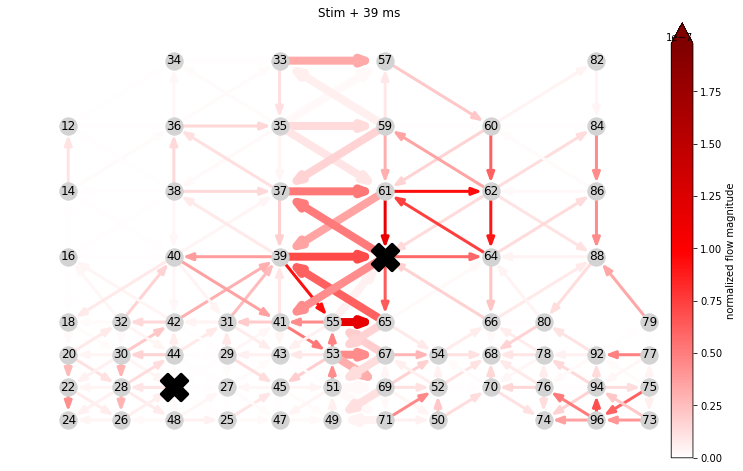

In [5]:
# create and play the animation
nf_anim = flow_loader.generate_animation(flow_mtx_avg)

ani = animation.FuncAnimation(nf_anim.fig, nf_anim.animate, np.shape(flow_mtx_avg)[1], interval=500)
from IPython.display import HTML
HTML(ani.to_jshtml())

### Decompose flow into different components

Decompose flow into gradient and rotational component. ``V_grad`` are all the gradient components of the  flow signal and ``lmda_grad`` its corresponding frequencies. ``S1_grad`` can be regarded as the spectrum of the gradient flow. That is,
$$\sum_{k=0}^{N-1}S^1_{grad}[k] * V_{grad}[k] = s^1_{grad},$$

where $s^1_{grad}$ is the gradient flow in time domain. Note that $V_{grad}[k]$ is a vector with $E$ (number of edges) dimensions.

We can also compute a spectrum for the rotational (also called harmonic) flow. The only difference here is that the frequencies of all harmonic components are zero.


In [6]:
# get graph
G = flow_loader.graph

# flow decomposition
lmda_grad, V_grad, S1_grad, V_harm, S1_harm = G.flow_ft(flow_mtx_avg[:,15])

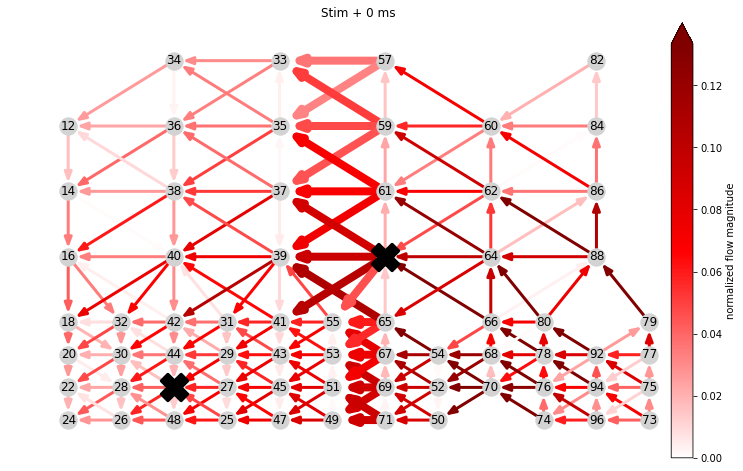

In [7]:
# plot gradient component with lowest frequency
nf_anim = flow_loader.generate_animation(V_grad[:,0].reshape(-1,1))

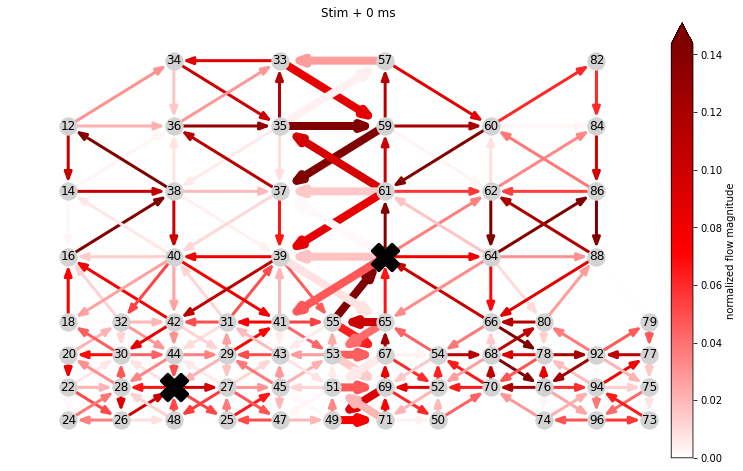

In [8]:
# plot one rotational component
nf_anim = flow_loader.generate_animation(V_harm[:,10].reshape(-1,1))

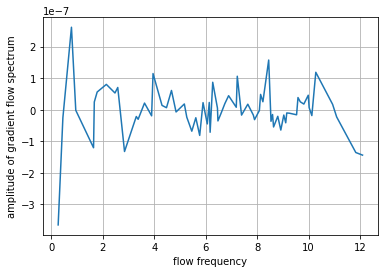

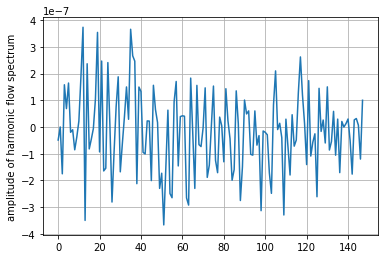

In [9]:
# plot spectrum of gradient flow
plt.plot(lmda_grad, S1_grad)
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.grid()
plt.show()

# plot spectrum of rotational flow
plt.plot(S1_harm)
plt.ylabel('amplitude of harmonic flow spectrum')
plt.grid()
plt.show()

#### Research Questions:

* Is the flow spectrum of a single experimental session differnt at the beginning of the session compared to at the end of the session?
* Can we compare flow spectra btween differnt sessions? (This might be difficult since the dimension of the spectrum depends in the size of the graph, which differs between experimental sessions)
* How does the spectrum after stimulation change over time? (i.e, compare spectrum 1ms, 2ms, 3ms, ... after stim -> time dependent spectrum)

## Comparing distribution of flow across and within physiological regions

The distribution of the flow within the S1 (M1) region is the distribution obtained from **all** the flow across all edges that are completely within S1 (M1). It is not the distribution of the flow across a single edge. The across flow distribution is the distribution of the flow across all edges that connect S1 and M1

In [10]:
def kl_divergence(p, q):
    kl_div = p * np.log(p / q)
    idx_finite = np.isfinite(kl_div)
    return np.sum(kl_div[idx_finite])

In [13]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

block_id = 1 # numbers of conditioning blocks
flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

# get indices of edges within S1, within M1, and across physiological boundary
idx_s1, idx_m1, idx_across = flow_loader.get_edge_affiliation()
num_fits = flow_loader.get_num_model_fits()

t_after_stim = 5 # time after first laser in milliseconds

# vectors to store the flow flow all trials
flow_s1 = np.array([])
flow_m1 = np.array([])
flow_across = np.array([])

# iterate over all trials. Only store the flow 5 milliseconds after the first laser stimulation
for i in range(num_fits):
    flow_mtx_single = flow_loader.get_single_flow_mtx(i)
    flow_s1 = np.concatenate([flow_s1, flow_mtx_single[idx_s1,t_after_stim]])
    flow_m1 = np.concatenate([flow_m1, flow_mtx_single[idx_m1,t_after_stim]])
    flow_across = np.concatenate([flow_across, flow_mtx_single[idx_across,t_after_stim]])

# compute the distribution for the S1, M1 and across flow
bin_edge_min = np.min([min(flow_s1), min(flow_m1), min(flow_across)])
bin_edge_max = np.max([max(flow_s1), max(flow_m1), max(flow_across)])

bin_edges = np.linspace(bin_edge_min, bin_edge_max, 1000)
hist_s1, _ = np.histogram(flow_s1, bins=bin_edges, density=True)
hist_m1, _ = np.histogram(flow_m1, bins=bin_edges, density=True)
hist_across, _ = np.histogram(flow_across, bins=bin_edges, density=True)

# compute KL divergences between all distributions
kl_s1_m1 = kl_divergence(hist_m1, hist_s1)
kl_s1_across = kl_divergence(hist_s1, hist_across)
kl_m1_across = kl_divergence(hist_m1, hist_across)

print(f'KL divergence S1 - M1: {kl_s1_m1}')
print(f'KL divergence S1 - across: {kl_s1_across}')
print(f'KL divergence M1 - across: {kl_m1_across}')

KL divergence S1 - M1: 2535485.6460045013
KL divergence S1 - across: 886177.2899278988
KL divergence M1 - across: 6752399.912766352


/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_24467/1032146672.py:2: RuntimeWarning: divide by zero encountered in true_divide
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_24467/1032146672.py:2: RuntimeWarning: invalid value encountered in true_divide
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_24467/1032146672.py:2: RuntimeWarning: divide by zero encountered in log
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_24467/1032146672.py:2: RuntimeWarning: invalid value encountered in multiply
  kl_div = p * np.log(p / q)


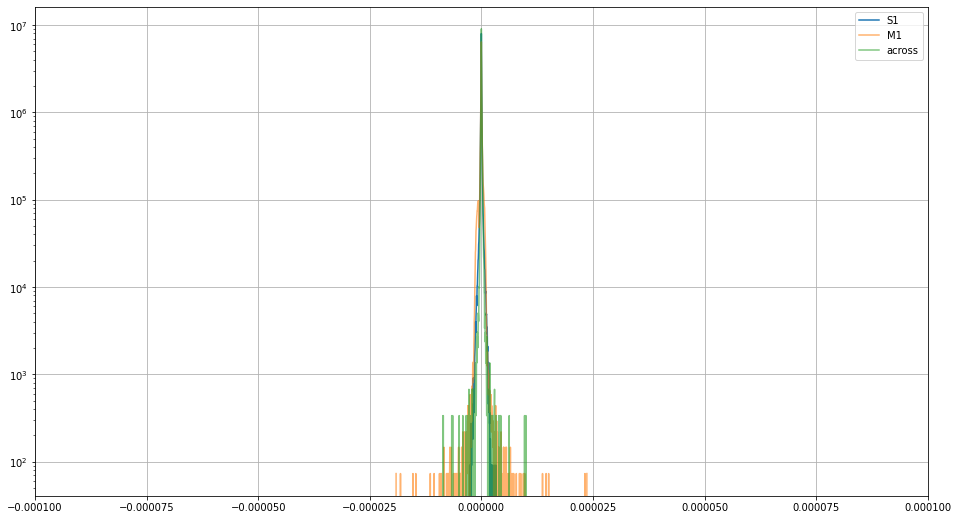

In [14]:
# plot histograms of flow distributions
fig, ax = plt.subplots(figsize=(16,9))
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_s1, label='S1')
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_m1, alpha=0.6, label='M1')
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_across, alpha=0.6, label='across')
plt.yscale('log')
plt.xlim(-1e-4, 1e-4)
plt.legend()
plt.grid()
plt.show()

### Task 1 (Statistical analysis of Flow):
* compute KL divergence as defined above for all blocks and all sessions
* plot histograms for all sessions and look for patterns

### Task 2 (Clustering of Flow):
* take entire flow signal (start with an average or single snapshot at the beginning and later extend to entire time varying flow) from differnt blocks of same session and perform clustering.
* do data from recording (conditioning) block cluster together and are separated from the other block type?

### Task 3 (Flow decomposition):
* using PCA or related techniques to decompose the flow signals into different components
* compare the components across blocks and sessions

### Task 4 (Analyze flow time series):
* Analyze time series of edges. Look for number and location of peaks, oscillation patterns, etc.
* could compute fourier transforms of time series

# Other Tasks:

### Task 1 (may not be feasible yet):
* take entire flow signal (start with an average or single snapshot at the beginning and later extend to entire time varying flow) form two (later more) sessions and perform clustering.
* Do separate clusters form for differnt sessions
* if we consider more then 2 sessions, do sessions with similar stimulation protocol cluster together
(Comparing different sessions is challenging, since the length of the flow vectors differ between sessions

### Task 2 (Learning Flow Model or Flow Signal):
* using neural nets to learn the parameters of the flow generating model
* this can be phased as a supervised learning problem.
* Would require some background in machine learning and/or deep learning. Probably also requires using tensorflow or pytorch
* this problem might be similar to the concepts of auto encoders or GANs

In [123]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
%matplotlib inline

# Clustering the amplitude of gradient flow spectrum

In [130]:
# Compute Average Flow
def avg_flow(base_path_model, base_path_ecog, session):
    block_ids = [1,2,3,4,5] # numbers of conditioning blocks
    total_iter_cnt = 0 # counter for total number of iterations

    # iterate over all conditioning blocks
    for block_id in tqdm(block_ids):
        flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

        # iterate over all trials
        num_fits = flow_loader.get_num_model_fits()
        for i in range(num_fits):
            if total_iter_cnt == 0:
                flow_mtx_avg = flow_loader.get_single_flow_mtx(i)
                np_mtx_avg, t, stim_time, idx = flow_loader.preprocess.select_data_around_stim(
                    i, flow_loader.T, which_stim=flow_loader.which_stim
                )
            else:
                flow = flow_loader.get_single_flow_mtx(i)
                flow_mtx_avg += flow
            total_iter_cnt += 1

    # compute average flow
    flow_mtx_avg /= total_iter_cnt
    return flow_mtx_avg

In [162]:
# Get lmda_grad, S1_grad
def get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg):
    # build flow_loader
    flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', 1, bp_filter=[])
    
    # get graph
    G = flow_loader.graph

    # flow decomposition
    lmda_grad, V_grad, S1_grad, V_harm, S1_harm = G.flow_ft(flow_mtx_avg[:,15])
    return lmda_grad, S1_grad

In [163]:
# Clustering
def cluster(num, lmda_grad, S1_grad):
    Kmean = KMeans(n_clusters=num)
    X = np.vstack((lmda_grad, S1_grad)).T
    Kmean.fit(X)
    return Kmean

In [164]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'

## MonkeyG_20150908_Session2_M1

In [202]:
session = "MonkeyG_20150908_Session2_M1" # the session

In [203]:
# Compute average flow
flow_mtx_avg = avg_flow(base_path_model, base_path_ecog, session)

# Get lmda_grad, S1_grad
lmda_grad, S1_grad = get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg)

  0%|          | 0/5 [00:00<?, ?it/s]

In [204]:
# Clustering the specturm of gradient flow
# one cluster
Kmean1 = cluster(1, lmda_grad, S1_grad)
print(Kmean1.cluster_centers_)

# two clusters
Kmean2 = cluster(2, lmda_grad, S1_grad)
print(Kmean2.cluster_centers_)

# three clusters
Kmean3 = cluster(3, lmda_grad, S1_grad)
print(Kmean3.cluster_centers_)

[[ 6.48484848e+00 -2.35978441e-09]]
[[ 8.45691477e+00 -2.66752337e-10]
 [ 3.25065978e+00 -5.79235701e-09]]
[[ 2.23177305e+00 -2.32966093e-09]
 [ 9.39271479e+00 -6.02130176e-09]
 [ 6.02992748e+00  1.91756310e-09]]


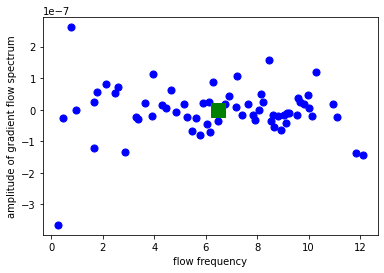

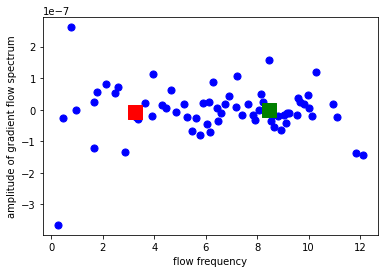

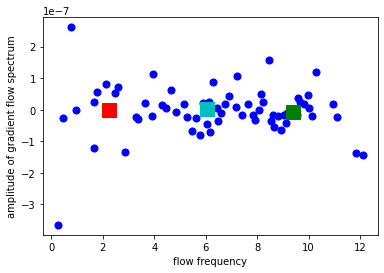

In [205]:
# Plot the position of only one cluster
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(6.48484848e+00, -2.35978441e-09, s=200, c='g', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of two clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(8.45691477e+00, -2.66752337e-10, s=200, c='g', marker='s')
plt.scatter(3.25065978e+00, -5.79235701e-09, s=200, c='r', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of three clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(9.39271479e+00, -6.02130176e-09, s=200, c='g', marker='s')
plt.scatter(2.23177305e+00, -2.32966093e-09, s=200, c='r', marker='s')
plt.scatter(6.02992748e+00, 1.91756310e-09, s=200, c='c', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

## MonkeyG_20150910_Session6_S1

In [198]:
session = "MonkeyG_20150910_Session6_S1" # the session

In [199]:
# Compute average flow
flow_mtx_avg = avg_flow(base_path_model, base_path_ecog, session)

# Get lmda_grad, S1_grad
lmda_grad, S1_grad = get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg)

  0%|          | 0/5 [00:00<?, ?it/s]

In [200]:
# Clustering the specturm of gradient flow
# one cluster
Kmean1 = cluster(1, lmda_grad, S1_grad)
print(Kmean1.cluster_centers_)

# two clusters
Kmean2 = cluster(2, lmda_grad, S1_grad)
print(Kmean2.cluster_centers_)

# two clusters
Kmean3 = cluster(3, lmda_grad, S1_grad)
print(Kmean3.cluster_centers_)

[[ 6.62790698e+00 -1.09391081e-09]]
[[ 3.31018589e+00 -1.72532095e-11]
 [ 8.59396392e+00 -1.73193012e-09]]
[[ 9.64292207e+00 -1.96679502e-09]
 [ 2.12417195e+00 -2.06571330e-10]
 [ 6.11458735e+00 -7.05467982e-10]]


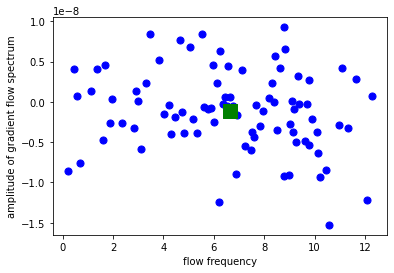

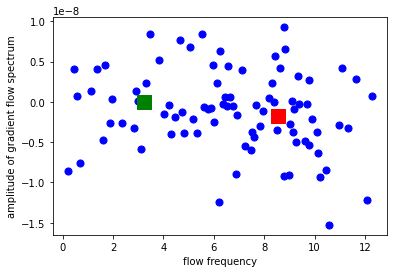

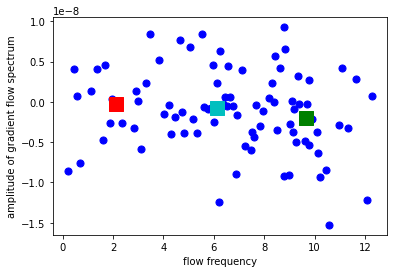

In [201]:
# Plot the position of only one cluster
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(6.62790698e+00, -1.09391081e-09, s=200, c='g', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of two clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(3.22704103e+00, 8.54836472e-12, s=200, c='g', marker='s')
plt.scatter(8.54475869e+00, -1.71529689e-09, s=200, c='r', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of three clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(9.64292207e+00, -1.96679502e-09, s=200, c='g', marker='s')
plt.scatter(2.12417195e+00, -2.06571330e-10, s=200, c='r', marker='s')
plt.scatter(6.11458735e+00, -7.05467982e-10, s=200, c='c', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

## MonkeyG_20150911_Session3_S1

In [194]:
session = "MonkeyG_20150911_Session3_S1" # the session

In [195]:
# Compute average flow
flow_mtx_avg = avg_flow(base_path_model, base_path_ecog, session)

# Get S1_grad
lmda_grad, S1_grad = get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg)

  0%|          | 0/5 [00:00<?, ?it/s]

In [196]:
# Clustering the specturm of gradient flow
# one cluster
Kmean1 = cluster(1, lmda_grad, S1_grad)
print(Kmean1.cluster_centers_)

# two clusters
Kmean2 = cluster(2, lmda_grad, S1_grad)
print(Kmean2.cluster_centers_)

# two clusters
Kmean3 = cluster(3, lmda_grad, S1_grad)
print(Kmean3.cluster_centers_)

[[6.63636364e+00 5.52686937e-10]]
[[ 8.60077175e+00  9.50416955e-10]
 [ 3.36235011e+00 -1.10196427e-10]]
[[ 9.61616197e+00  1.42513079e-09]
 [ 2.22789780e+00  3.64985382e-09]
 [ 6.14776894e+00 -2.24970314e-09]]


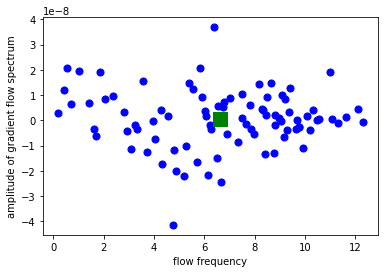

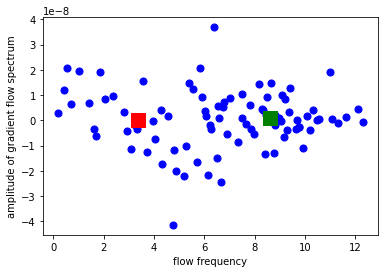

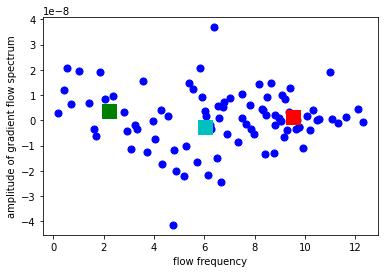

In [197]:
# Plot the position of only one cluster
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(6.63636364e+00, 5.52686937e-10, s=200, c='g', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of two clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(8.60077175e+00, 9.50416955e-10, s=200, c='g', marker='s')
plt.scatter(3.36235011e+00, --1.10196427e-10, s=200, c='r', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of three clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(2.22789780e+00, 3.64985382e-09, s=200, c='g', marker='s')
plt.scatter(9.51953660e+00, 1.42406067e-09, s=200, c='r', marker='s')
plt.scatter(6.03932870e+00, -2.48551196e-09, s=200, c='c', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

## MonkeyJ_20160427_Session2_S1

In [190]:
session = "MonkeyJ_20160427_Session2_S1" # the session

In [191]:
# Compute average flow
flow_mtx_avg = avg_flow(base_path_model, base_path_ecog, session)

# Get lmda_grad, S1_grad
lmda_grad, S1_grad = get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg)

  0%|          | 0/5 [00:00<?, ?it/s]

In [192]:
# Clustering the specturm of gradient flow
# one cluster
Kmean1 = cluster(1, lmda_grad, S1_grad)
print(Kmean1.cluster_centers_)

# two clusters
Kmean2 = cluster(2, lmda_grad, S1_grad)
print(Kmean2.cluster_centers_)

# two clusters
Kmean3 = cluster(3, lmda_grad, S1_grad)
print(Kmean3.cluster_centers_)

[[6.38888889e+00 2.82570320e-09]]
[[8.50385721e+00 2.91522575e-09]
 [3.42793325e+00 2.70037165e-09]]
[[9.32719011e+00 3.24059419e-09]
 [1.91592174e+00 3.21190375e-09]
 [5.74188074e+00 2.18910153e-09]]


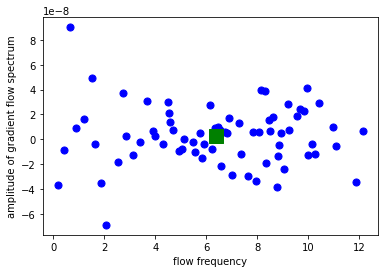

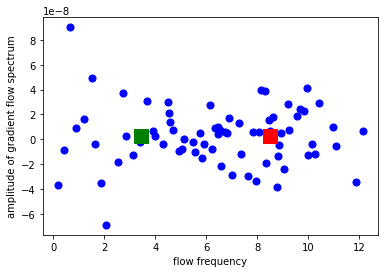

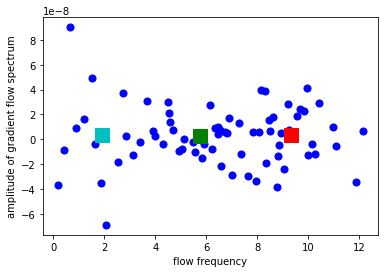

In [193]:
# Plot the position of only one cluster
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(6.38888889e+00, 2.82570320e-09, s=200, c='g', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of two clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(3.42793325e+00, 2.70037165e-09, s=200, c='g', marker='s')
plt.scatter(8.50385721e+00, 2.91522575e-09, s=200, c='r', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of three clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(5.74188074e+00, 2.18910153e-09, s=200, c='g', marker='s')
plt.scatter(9.32719011e+00, 3.24059419e-09, s=200, c='r', marker='s')
plt.scatter(1.91592174e+00, 3.21190375e-09, s=200, c='c', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

## MonkeyJ_20160627_Session1_S1

In [184]:
session = "MonkeyJ_20160627_Session1_S1" # the session

In [185]:
# Compute average flow
flow_mtx_avg = avg_flow(base_path_model, base_path_ecog, session)

# Get lmda_grad, S1_grad
lmda_grad, S1_grad = get_S1_grat(base_path_model, base_path_ecog, session, flow_mtx_avg)

  0%|          | 0/5 [00:00<?, ?it/s]

In [186]:
# Clustering the specturm of gradient flow
# one cluster
Kmean1 = cluster(1, lmda_grad, S1_grad)
print(Kmean1.cluster_centers_)

# two clusters
Kmean2 = cluster(2, lmda_grad, S1_grad)
print(Kmean2.cluster_centers_)

# two clusters
Kmean3 = cluster(3, lmda_grad, S1_grad)
print(Kmean3.cluster_centers_)

[[ 4.98412698e+00 -5.64254472e-11]]
[[ 2.70416531e+00 -2.18007182e-09]
 [ 7.19283985e+00  2.00085698e-09]]
[[ 5.06248059e+00  2.61194192e-10]
 [ 1.60639961e+00 -4.96623112e-09]
 [ 8.24432394e+00  4.37695076e-09]]


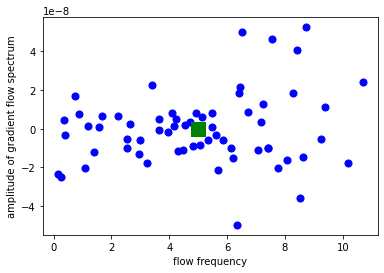

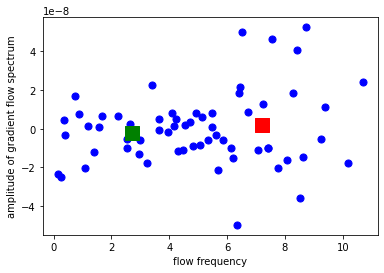

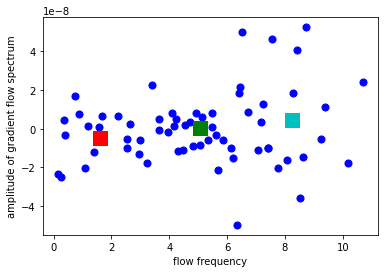

In [189]:
# Plot the position of only one cluster
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(4.98412698e+00, -5.64254472e-11, s=200, c='g', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of two clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(2.70416531e+00, -2.18007182e-09, s=200, c='g', marker='s')
plt.scatter(7.19283985e+00, 2.00085698e-09, s=200, c='r', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()

# Plot the positions of three clusters
plt.scatter(lmda_grad, S1_grad, s =50, c='b')
plt.scatter(5.06248059e+00, 2.61194192e-10, s=200, c='g', marker='s')
plt.scatter(1.60639961e+00, -4.96623112e-09, s=200, c='r', marker='s')
plt.scatter(8.24432394e+00, 4.37695076e-09, s=200, c='c', marker='s')
plt.xlabel('flow frequency')
plt.ylabel('amplitude of gradient flow spectrum')
plt.show()